<a href="https://colab.research.google.com/github/ktu100/Backend_Concepts/blob/main/DLCV_Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!sudo apt-get install python3.7

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpython3.7-minimal libpython3.7-stdlib python3.7-minimal
Suggested packages:
  python3.7-venv binfmt-support
The following NEW packages will be installed:
  libpython3.7-minimal libpython3.7-stdlib python3.7 python3.7-minimal
0 upgraded, 4 newly installed, 0 to remove and 34 not upgraded.
Need to get 4,670 kB of archives.
After this operation, 17.7 MB of additional disk space will be used.
Get:1 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 libpython3.7-minimal amd64 3.7.17-1+jammy1 [608 kB]
Get:2 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 python3.7-minimal amd64 3.7.17-1+jammy1 [1,837 kB]
Get:3 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 libpython3.7-stdlib amd64 3.7.17-1+jammy1 [1,864 kB]
Get:4 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu ja

In [ ]:
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.7 1

In [ ]:
!python --version

Python 3.11.12


In [ ]:
# Uninstall problematic packages
!pip uninstall -y numpy scipy tensorflow tensorflow-gpu scikit-learn patchify

# Clear pip cache
!pip cache purge

# Install packages in specific order with versions known to work together
!pip install numpy==1.23.5
!pip install scipy==1.10.1
!pip install scikit-learn==1.2.2
!pip install tensorflow==2.12.0
!pip install opencv-python matplotlib pillow patchify

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: scipy 1.13.1
Uninstalling scipy-1.13.1:
  Successfully uninstalled scipy-1.13.1
Found existing installation: tensorflow 2.18.0
Uninstalling tensorflow-2.18.0:
  Successfully uninstalled tensorflow-2.18.0
Found existing installation: scikit-learn 1.6.1
Uninstalling scikit-learn-1.6.1:
  Successfully uninstalled scikit-learn-1.6.1
Files removed: 0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 104.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.18 requires scikit-learn, which is not installed.
fastai 2.7.18 requires scipy, which is not installed.
imgaug 0.4.0 requires scipy, which is not installed.
shap 0.46.0 requires scikit-learn, which is not installed.
shap 0.46.0 requires scipy, whic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.1/34.1 MB 65.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.18 requires scikit-learn, which is not installed.
shap 0.46.0 requires scikit-learn, which is not installed.
umap-learn 0.5.7 requires scikit-learn>=0.22, which is not installed.
hdbscan 0.8.40 requires scikit-learn>=0.20, which is not installed.
mlxtend 0.23.4 requires scikit-learn>=1.3.1, which is not installed.
sklearn-pandas 2.2.0 requires scikit-learn>=0.23.0, which is not installed.
librosa 0.10.2.post1 requires scikit-learn>=0.20.0, which is not installed.
sentence-transformers 3.4.1 requires scikit-learn, which is not installed.
yellowbrick 1.5 requires scikit-learn>=1.0.0, which is not installed.
pynndescent 0.5.13 requires scikit-learn>=

In [ ]:
pip install patchify


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 84.6 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


**Necessary Imports**

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
import random
import matplotlib.pyplot as plt
from patchify import patchify
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


**Thresholding Method**

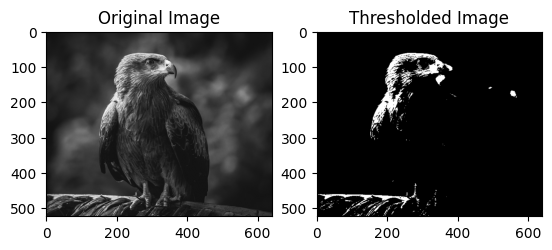

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Reading the image
image = cv2.imread('/Bird.jpg', cv2.IMREAD_GRAYSCALE)

if image is None:
    print("Error: Could not read the image. Check the filename or path.")
else:
    # Applying thresholding
    _, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)

    # Displaying the original and thresholded images
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    plt.subplot(122)
    plt.imshow(binary_image, cmap='gray')
    plt.title('Thresholded Image')

    plt.show()


**Region Based Method**

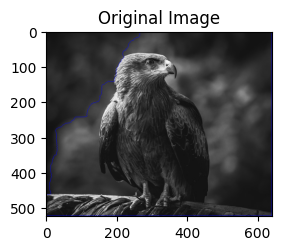

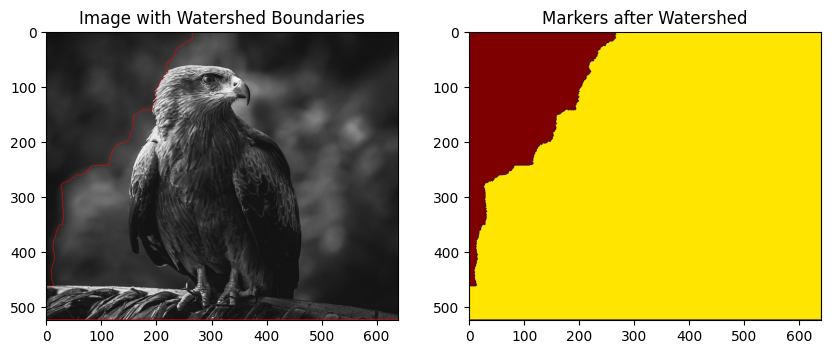

In [ ]:
# Reading the image
image = cv2.imread('/Bird.jpg')

# Converting the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Applying thresholding to create a binary image
ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Performing morphological operations to clean up the image
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Identifying sure background area using dilation
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# Identifying sure foreground area using distance transform
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

# Identifying unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# Marker labeling for watershed algorithm
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# Applying watershed algorithm
cv2.watershed(image, markers)

# Highlighting segmented regions in the original image
image[markers == -1] = [0, 0, 255]  # Marking watershed boundaries in red

plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.figure(figsize=(10,5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Image with Watershed Boundaries')

plt.subplot(122)
plt.imshow(markers, cmap='jet')
plt.title('Markers after Watershed')

plt.show()


**Edge Based Method**

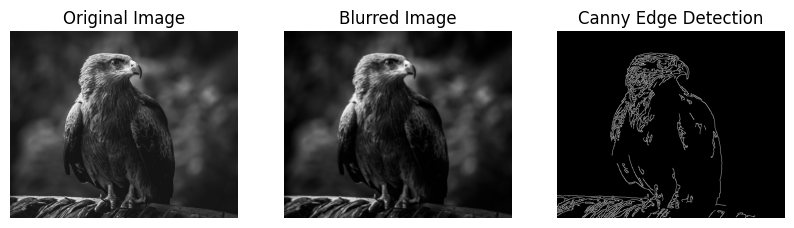

In [ ]:
# Reading the input image
image_path = '/Bird.jpg'
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Applying Gaussian blur to the image to reduce noise and improve edge detection
blurred_image = cv2.GaussianBlur(original_image, (5, 5), 0)

# Applying Canny edge detector
edges = cv2.Canny(blurred_image, 50, 150)  # You can adjust the threshold values

# Displaying the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')

plt.show()

**Clustering Based**

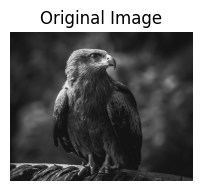

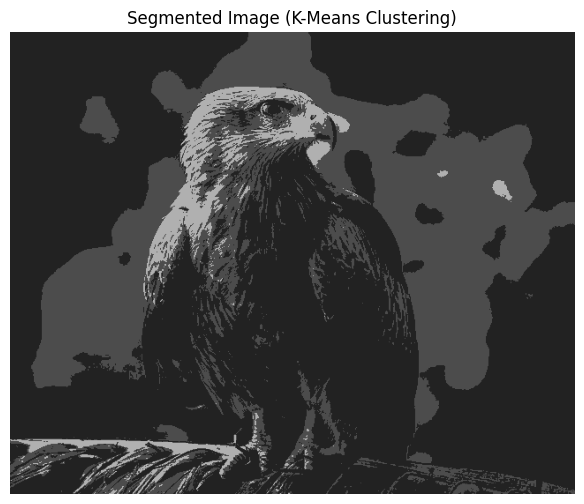

In [ ]:
# Reading the image
image = cv2.imread('/Bird.jpg')

# Reshaping the image to a 2D array of pixels
pixels = image.reshape((-1, 3))


pixels = np.float32(pixels)

# Defining criteria and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3
_, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)


centers = np.uint8(centers)

segmented_image = centers[labels.flatten()]


segmented_image = segmented_image.reshape(image.shape)

# Plotting the segmented image
plt.figure(figsize=(8,6))
plt.subplot(1, 3, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.figure(figsize=(8,6))
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image (K-Means Clustering)')
plt.axis('off')
plt.show()

**Deep Learning Approach**

In [ ]:
import tensorflow_datasets as tfds

In [ ]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-eor5a6s8
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-eor5a6s8
  Resolved https://github.com/tensorflow/examples.git to commit 6a3a323f3885f16085ad8335392f7ec836c677f4
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-examples: filename=tensorflow_examples-0.1744662746.606450842056059708696507624557970837683594229748-py3-none-any.whl size=301631 sha256=cf8075b08ea3d939ce5f555dc7b27626b1e443e77c2bdfbe5bdb05cf0acda99f
  Stored in directory: /tmp/pip-ephem-wheel-cache-od35sugp/wheels/91/9b/e8/6ae2ecc930bd726c578e35b313e987a687bc5ce03c3a42c2d5
Successfully built tensorflow-examples


In [ ]:
from tensorflow_examples.models.pix2pix import pix2pix

from IPython.display import clear_output
import matplotlib.pyplot as plt

**Loading the Dataset**

In [ ]:

dataset, info = tfds.load('oxford_iiit_pet', with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.7I4MLA_4.0.0/oxford_iiit_pet-train.tfrecord*...…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.7I4MLA_4.0.0/oxford_iiit_pet-test.tfrecord*...:…

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/4.0.0. Subsequent calls will reuse this data.


In [ ]:
print("Train samples:", info.splits['train'].num_examples)
print("Test samples:", info.splits['test'].num_examples)

Train samples: 3680
Test samples: 3669


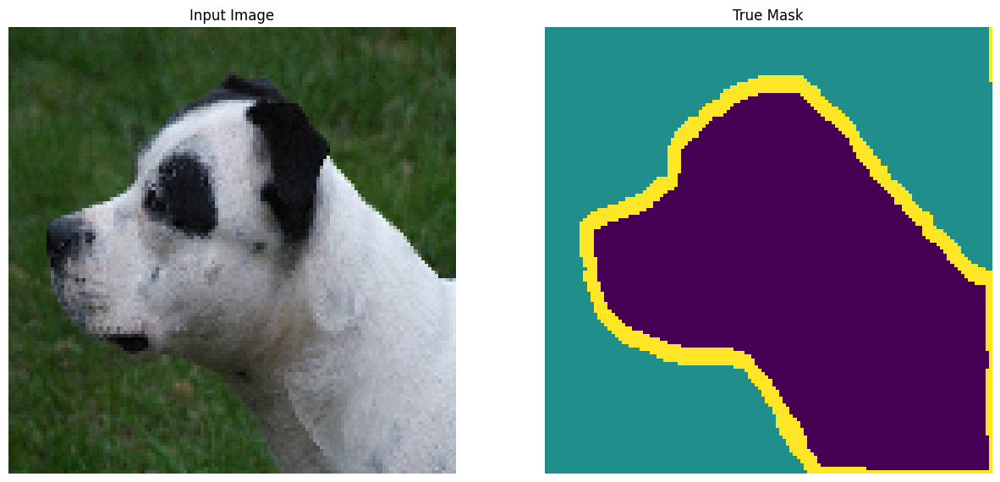

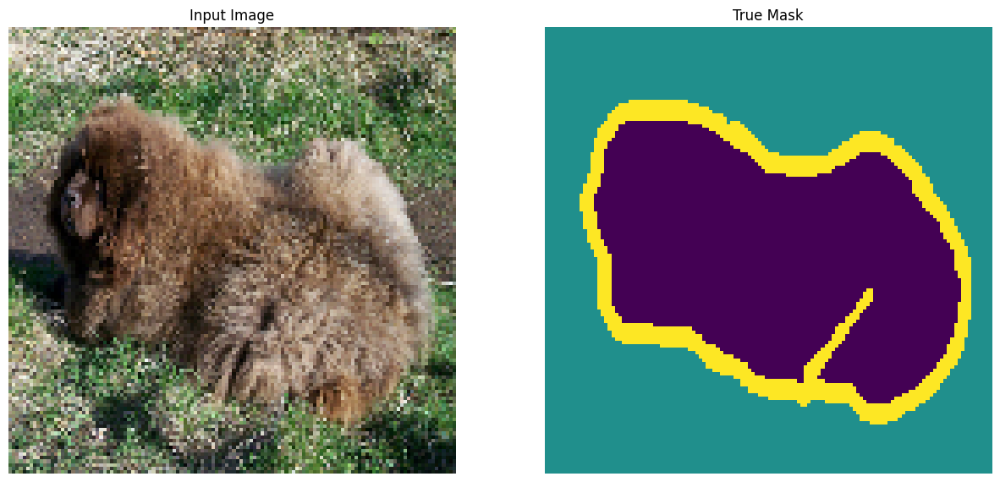

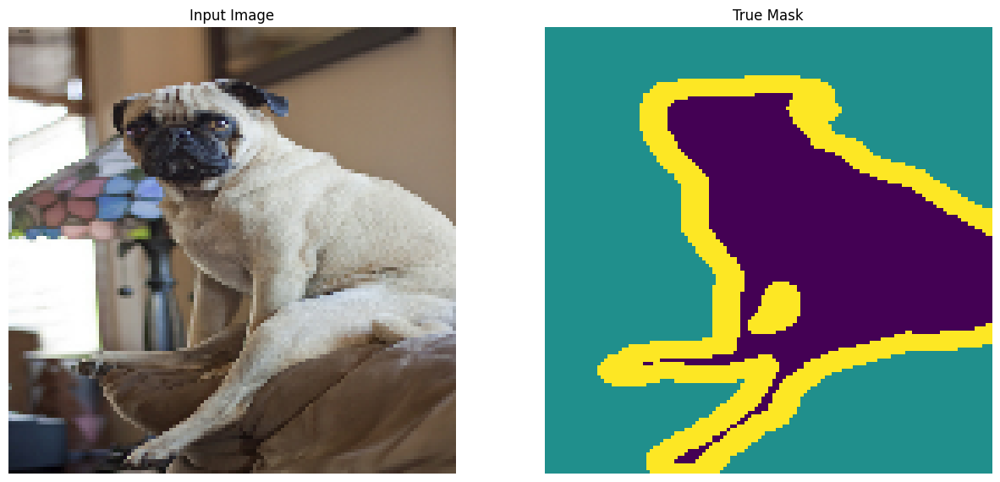

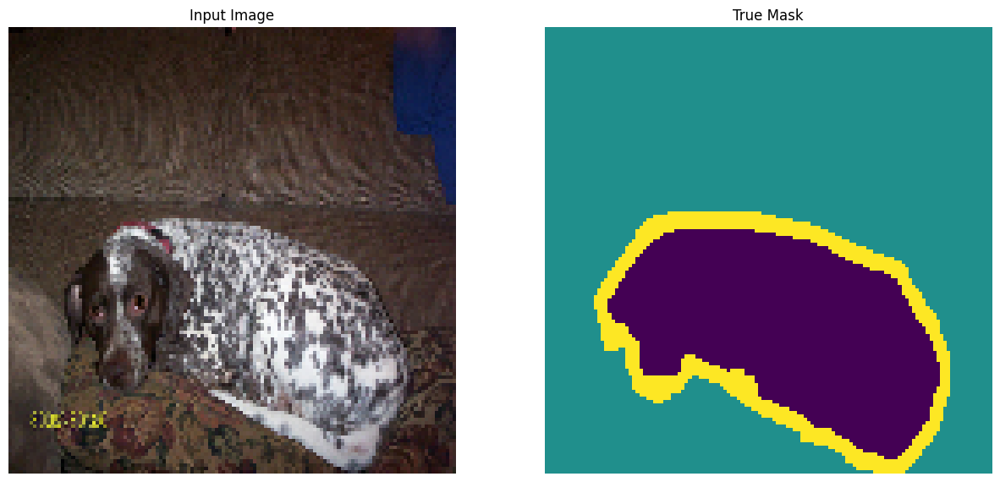

In [ ]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])
  sample_image, sample_mask = images[1], masks[1]
  display([sample_image, sample_mask])

**Normalizing**

In [ ]:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1
  return input_image, input_mask

In [ ]:
def load_image(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(
    datapoint['segmentation_mask'],
    (128, 128),
    method = tf.image.ResizeMethod.NEAREST_NEIGHBOR,
  )

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [ ]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 64
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

**Preparing Training And Testing Data**

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
train_images = dataset['train'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_images = dataset['test'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
    self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

In [ ]:
train_batches = (
    train_images
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_images.batch(BATCH_SIZE)

In [ ]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

**U Net Architecture**

The model that we used here is a modified U-Net. A U-Net consists of an encoder (downsampler) and decoder (upsampler). To learn robust features and reduce the number of trainable parameters, we use a pretrained model—MobileNetV2—as the encoder. For the decoder, we will use the upsample block, which is already implemented in the pix2pix example in the TensorFlow Examples repo.

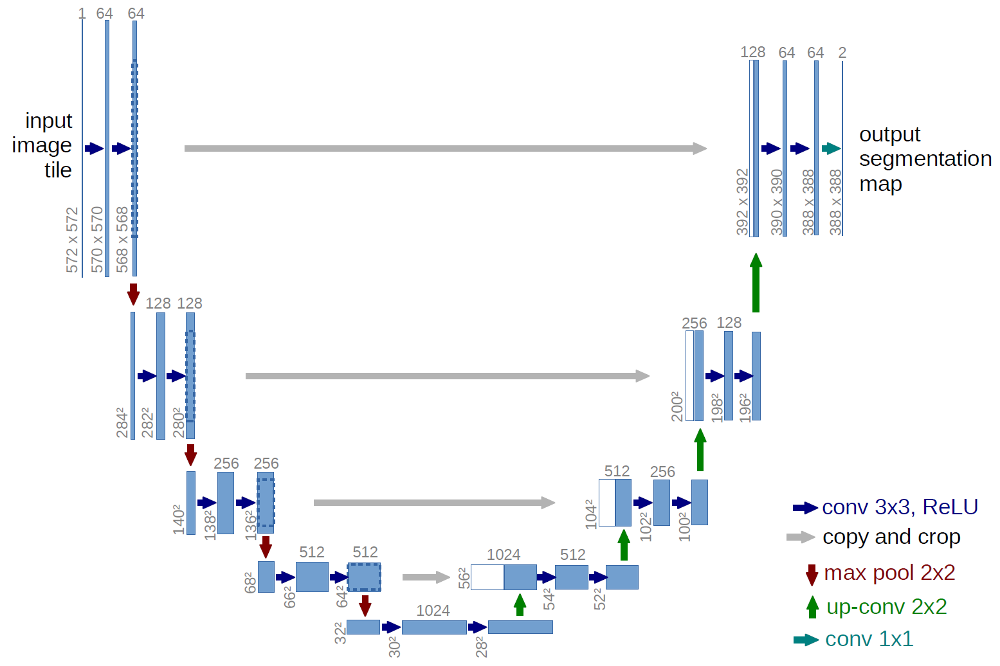

**Downsampling**

The encoder is a pretrained MobileNetV2 model. We will use the model from tf.keras.applications. The encoder consists of specific outputs from intermediate layers in the model. The encoder will not be trained during the training process.

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Using the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Creating the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


**Upsampling**

The decoder/upsampler is simply a series of upsample blocks implemented in TensorFlow examples:

In [ ]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [ ]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

**Training the model**

Since this is a multiclass classification problem,we use the tf.keras.losses.SparseCategoricalCrossentropy loss function with the from_logits argument set to True, since the labels are scalar integers instead of vectors of scores for each pixel of every class.

When running inference, the label assigned to the pixel is the channel with the highest value. This is what the create_mask function is doing.

In [ ]:
OUTPUT_CLASSES = 3

model = unet_model(output_channels=OUTPUT_CLASSES)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [ ]:
def show_predictions(dataset=None, num=1):
    if dataset:
      for image, mask in dataset.take(num):
        pred_mask = model.predict(image)
        display([image[0], mask[0], create_mask(pred_mask)])
    else:
      display([sample_image, sample_mask,
      create_mask(model.predict(sample_image[tf.newaxis, ...]))])


Checking what the model predicts before training:

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


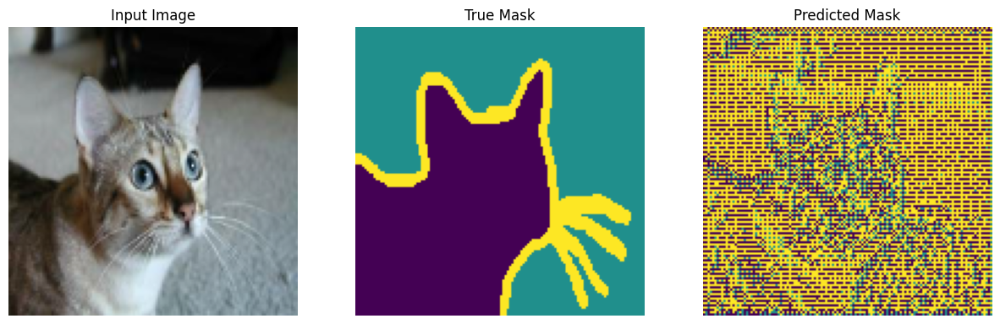

In [ ]:
show_predictions()

In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=False)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


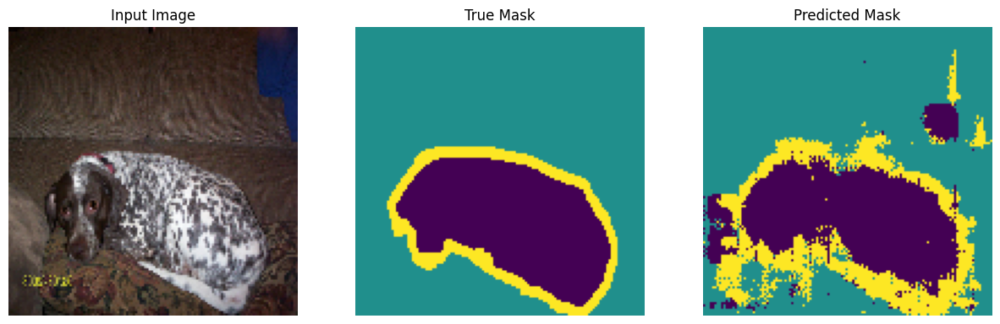


Sample Prediction after epoch 1

57/57 ━━━━━━━━━━━━━━━━━━━━ 38s 256ms/step - accuracy: 0.6763 - loss: 0.7271
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


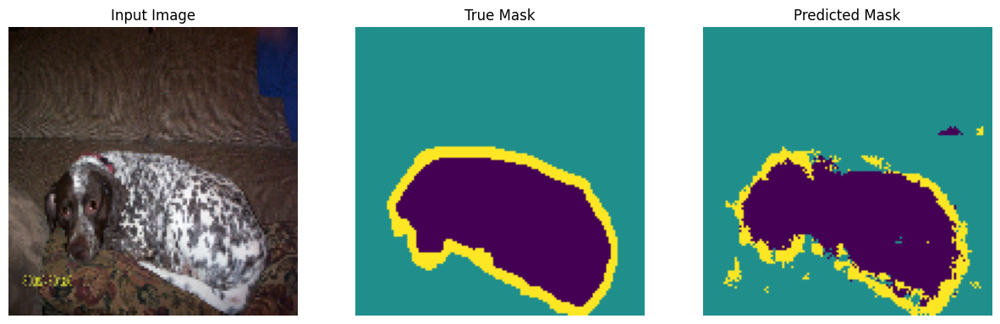


Sample Prediction after epoch 2

57/57 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - accuracy: 0.8849 - loss: 0.3089
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


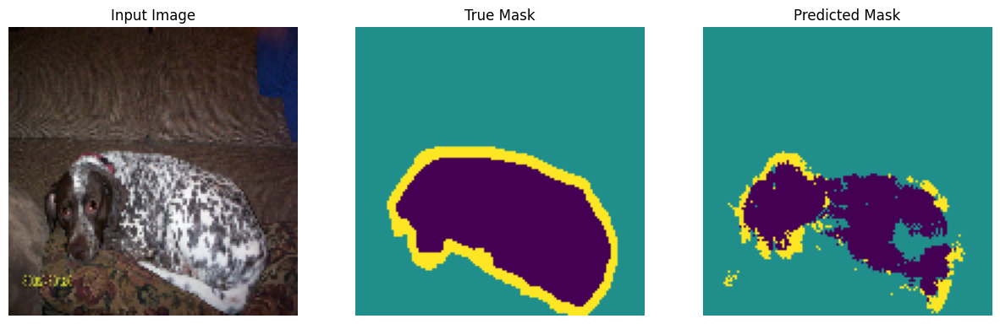


Sample Prediction after epoch 3

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.8923 - loss: 0.2816
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


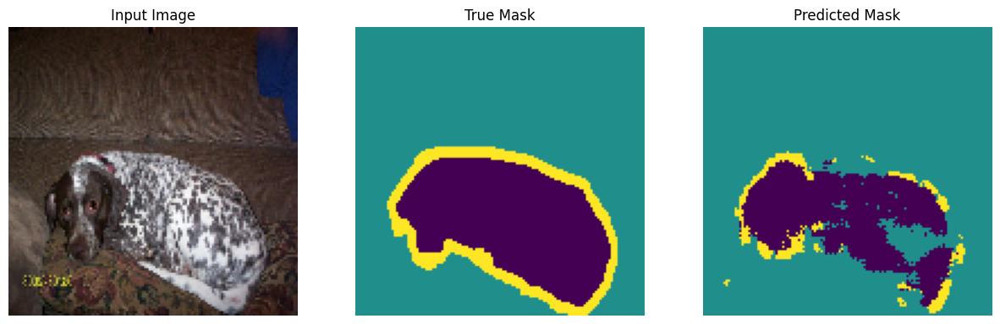


Sample Prediction after epoch 4

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.8997 - loss: 0.2586
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


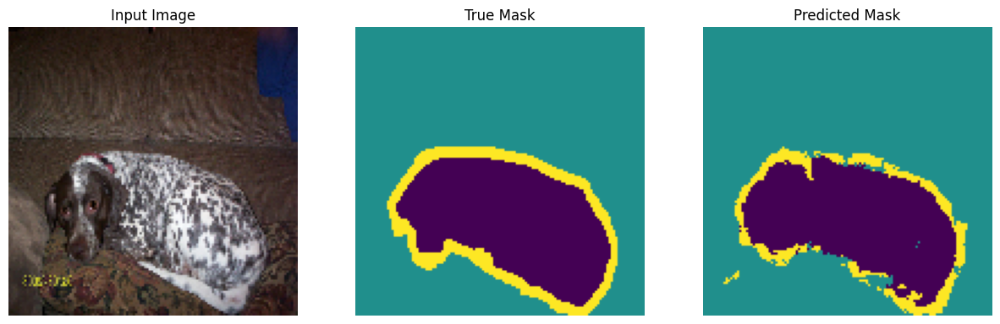


Sample Prediction after epoch 5

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9022 - loss: 0.2516
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


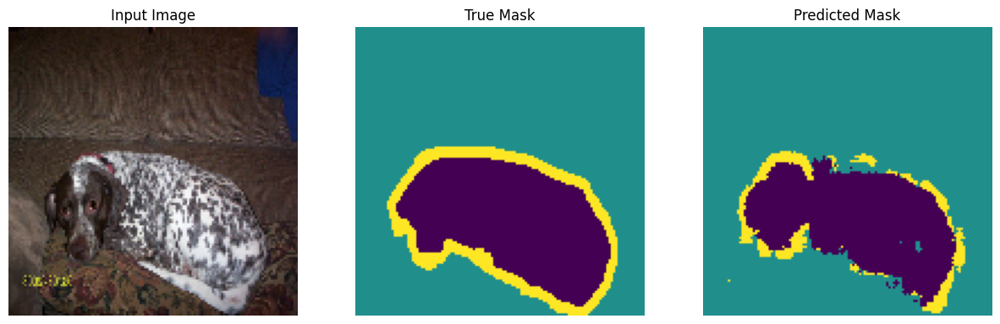


Sample Prediction after epoch 6

57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - accuracy: 0.9038 - loss: 0.2464
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


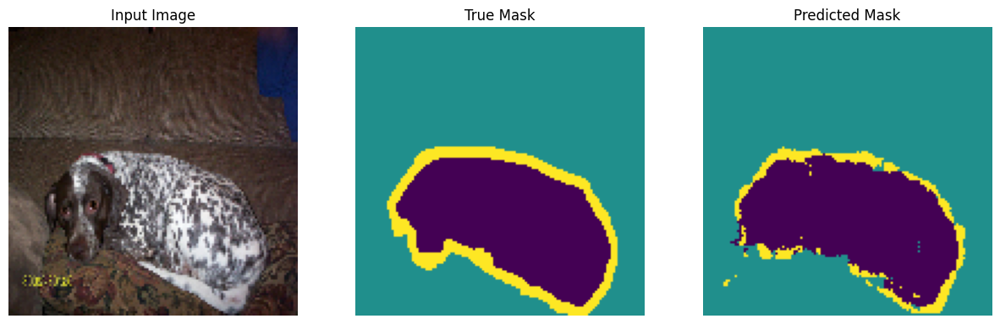


Sample Prediction after epoch 7

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step - accuracy: 0.9071 - loss: 0.2366
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


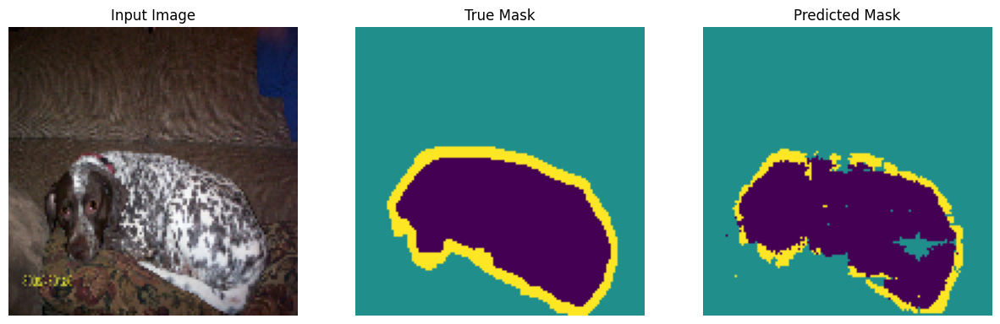


Sample Prediction after epoch 8

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - accuracy: 0.9094 - loss: 0.2295
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


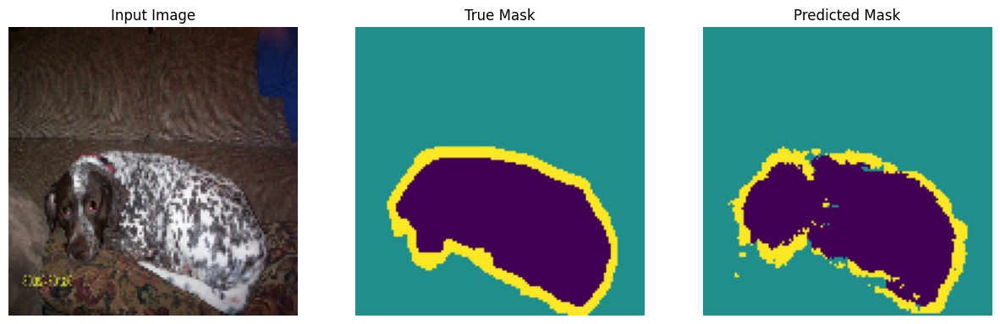


Sample Prediction after epoch 9

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9102 - loss: 0.2264
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


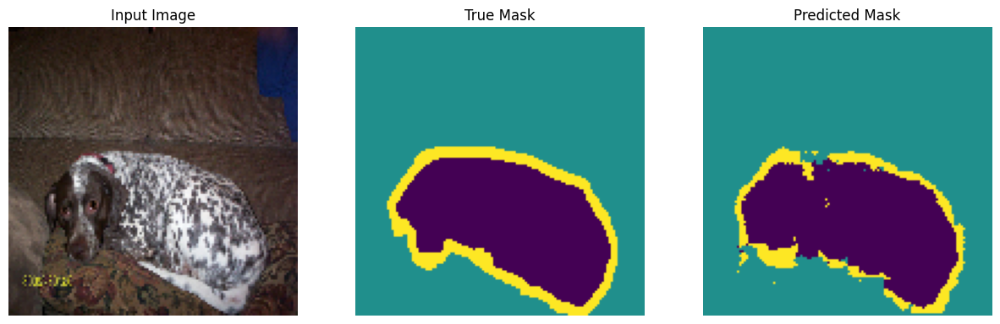


Sample Prediction after epoch 10

57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - accuracy: 0.9122 - loss: 0.2210
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


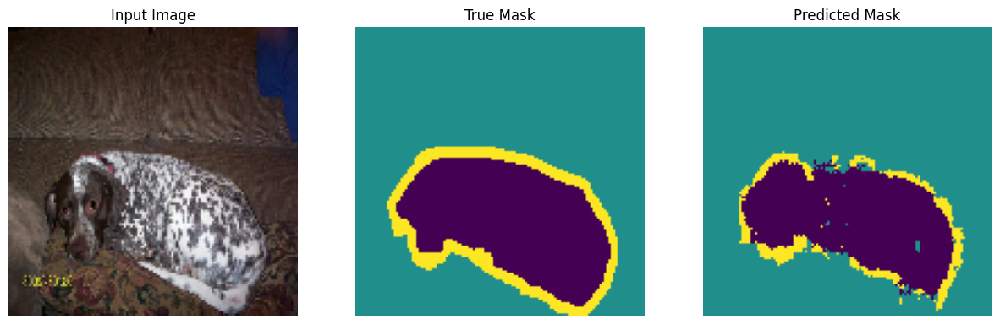


Sample Prediction after epoch 11

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9142 - loss: 0.2152
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


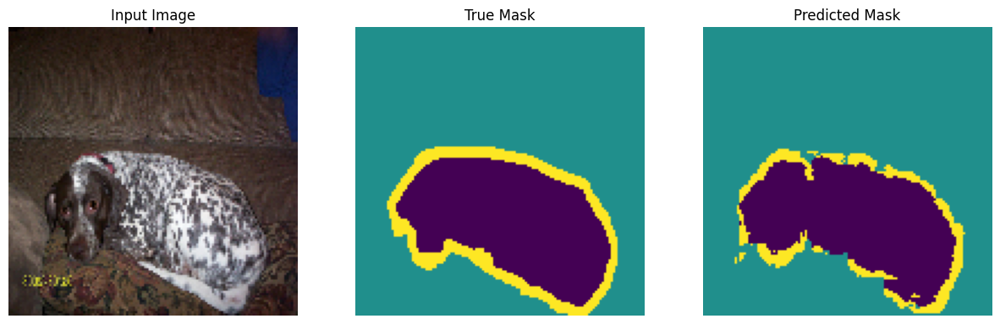


Sample Prediction after epoch 12

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.9134 - loss: 0.2164
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


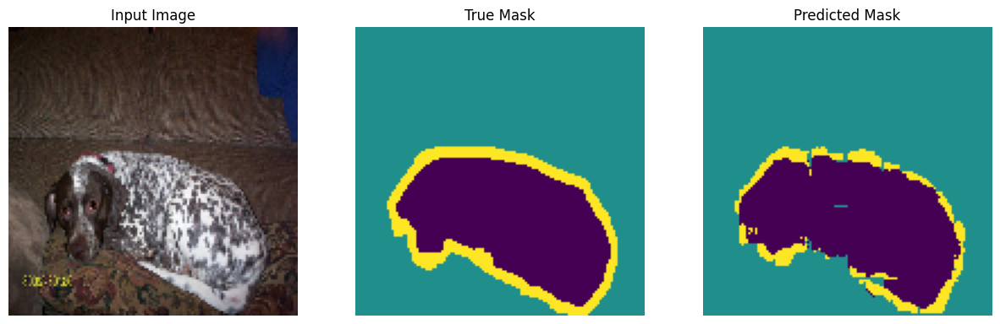


Sample Prediction after epoch 13

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9171 - loss: 0.2071
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


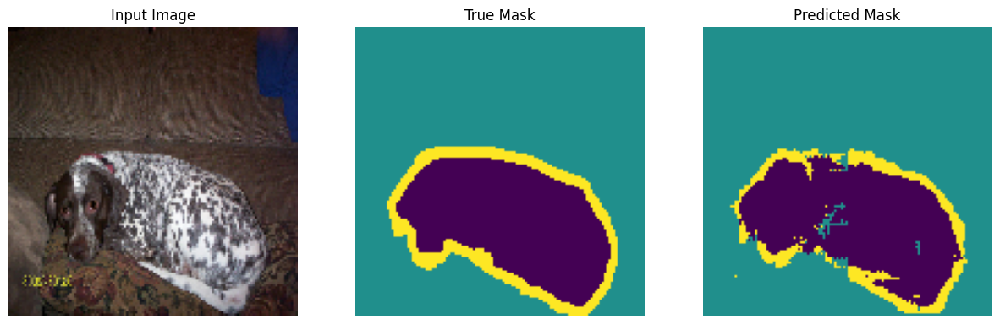


Sample Prediction after epoch 14

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.9198 - loss: 0.1985
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


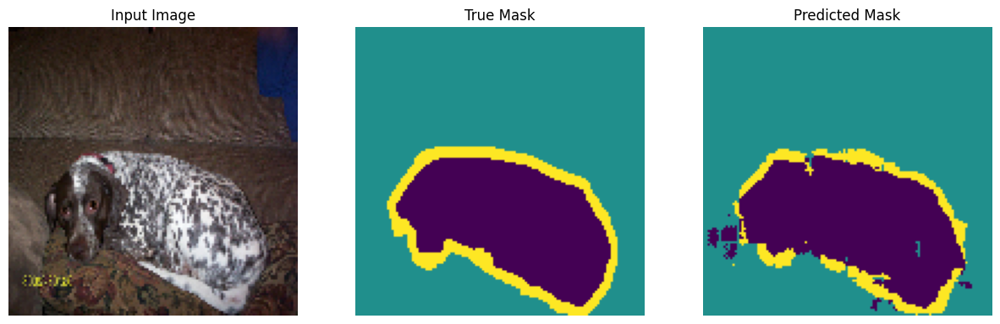


Sample Prediction after epoch 15

57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.9214 - loss: 0.1949
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


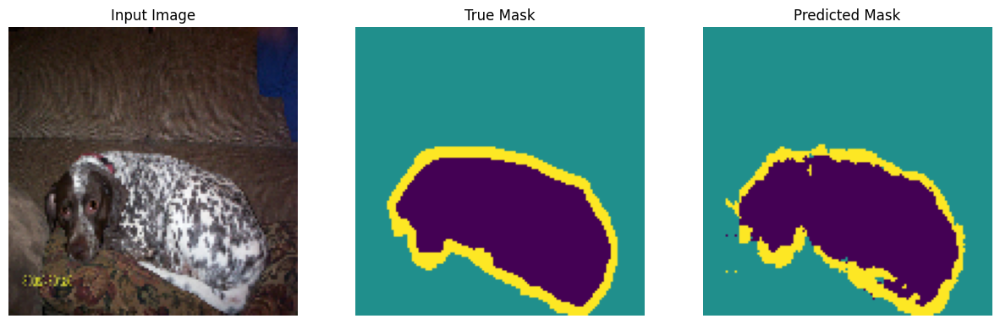


Sample Prediction after epoch 16

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.9217 - loss: 0.1932
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


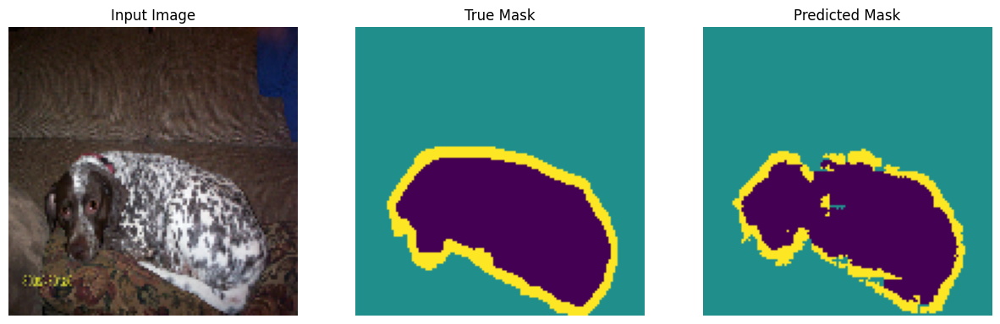


Sample Prediction after epoch 17

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9239 - loss: 0.1876
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


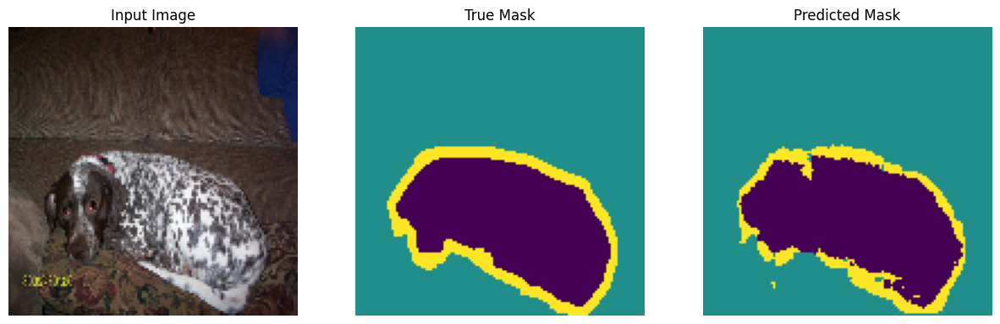


Sample Prediction after epoch 18

57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - accuracy: 0.9263 - loss: 0.1810
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


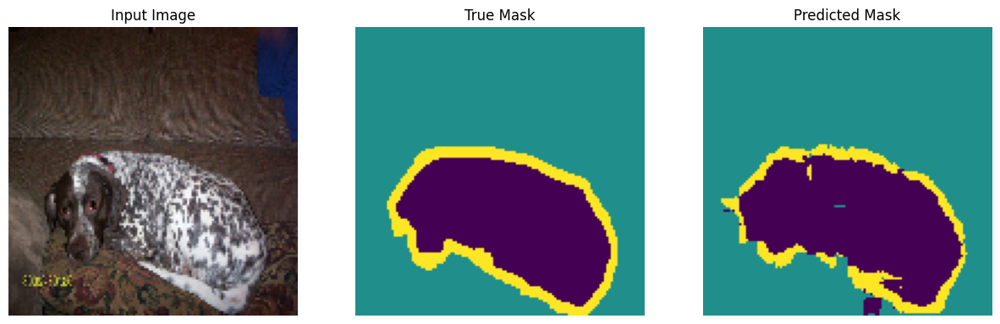


Sample Prediction after epoch 19

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.9275 - loss: 0.1778
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


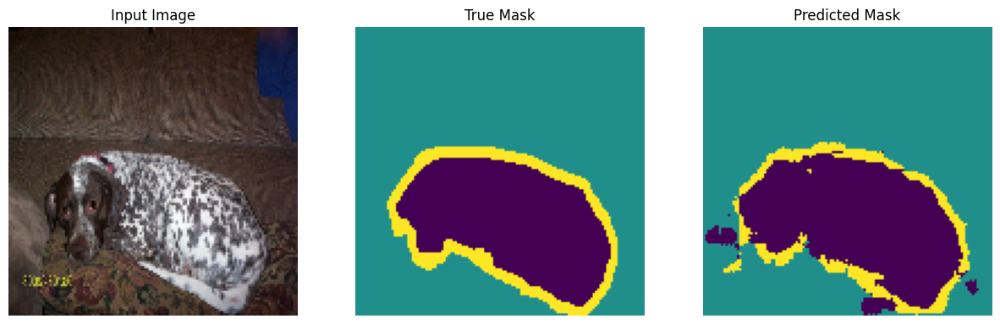


Sample Prediction after epoch 20

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.9285 - loss: 0.1750


In [ ]:
EPOCHS = 20

model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,

                          callbacks=[DisplayCallback()])

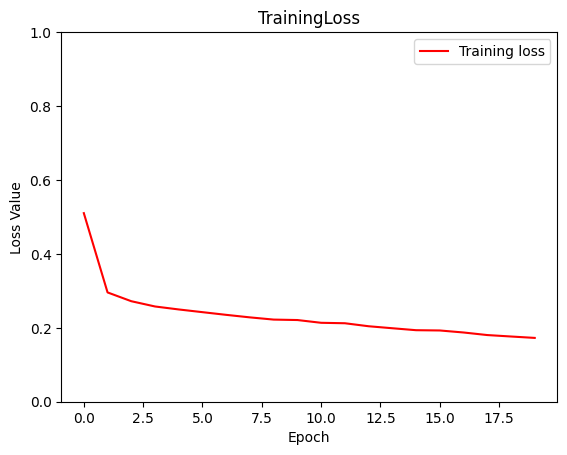

In [ ]:
loss = model_history.history['loss']

plt.figure()
plt.plot(model_history.epoch, loss, 'r', label='Training loss')
plt.title('TrainingLoss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step


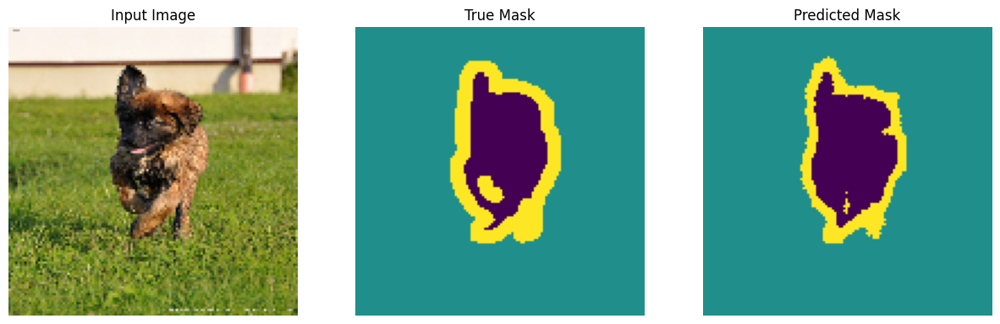

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


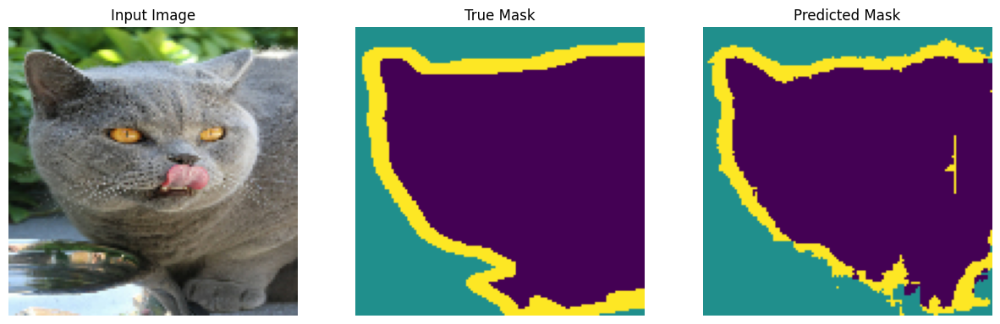

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


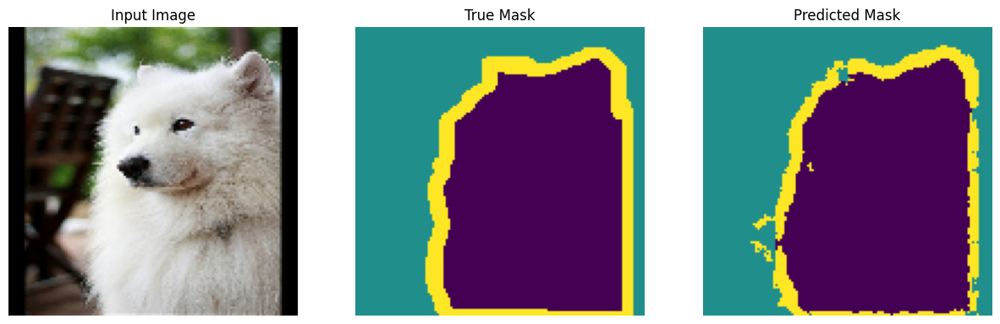

In [ ]:
show_predictions(test_batches, 3)

**Imbalanced Class and weights**

Semantic segmentation datasets can be highly imbalanced meaning that particular class pixels can be present more inside images than that of other classes. Since segmentation problems can be treated as per-pixel classification problems, we can deal with the imbalance problem by weighing the loss function to account for this. It's a simple and elegant way to deal with this problem.

In [ ]:
def add_sample_weights(image, label):

  class_weights = tf.constant([3.0, 3.0, 1.0])
  class_weights = class_weights/tf.reduce_sum(class_weights)

  # Creating an image of `sample_weights` by using the label at each pixel as an
  # index into the `class weights` .
  sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))

  return image, label, sample_weights

In [ ]:

train_batches.map(add_sample_weights).element_spec

(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))

In [ ]:
weighted_model = unet_model(OUTPUT_CLASSES)
weighted_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

Epoch 1/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


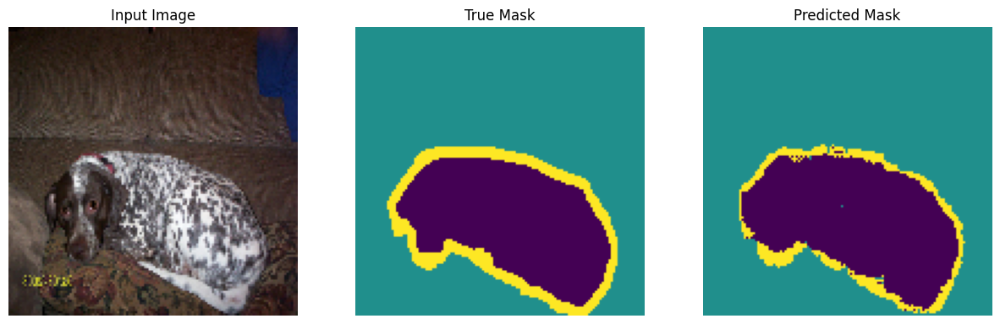


Sample Prediction after epoch 1

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step - accuracy: 0.9320 - loss: 0.1700
Epoch 2/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


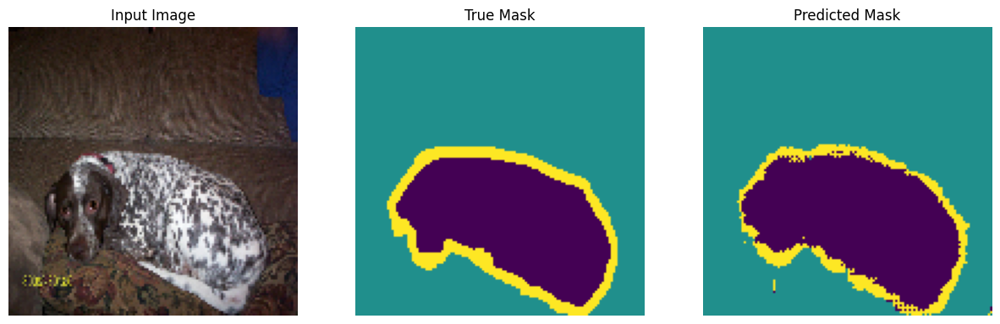


Sample Prediction after epoch 2

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - accuracy: 0.9348 - loss: 0.1634
Epoch 3/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


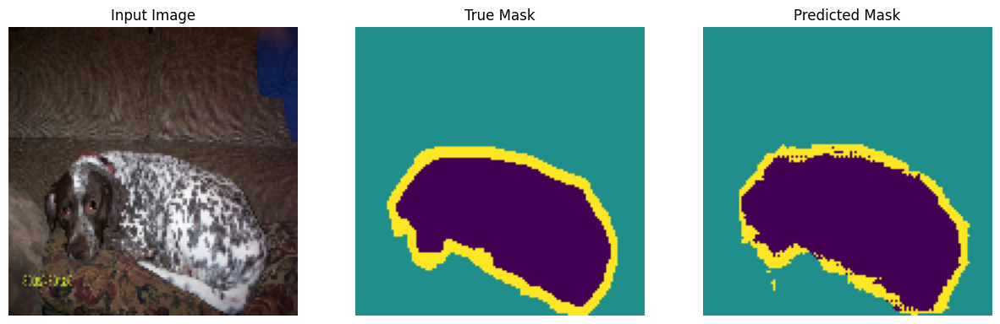


Sample Prediction after epoch 3

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - accuracy: 0.9333 - loss: 0.1671
Epoch 4/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


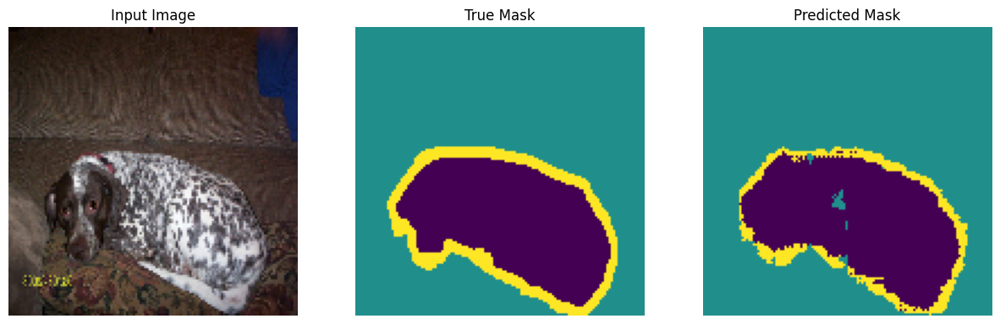


Sample Prediction after epoch 4

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - accuracy: 0.9335 - loss: 0.1655
Epoch 5/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


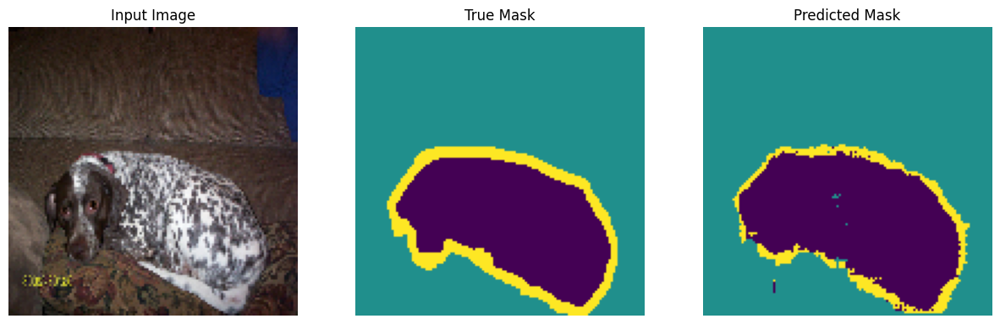


Sample Prediction after epoch 5

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.9346 - loss: 0.1627
Epoch 6/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


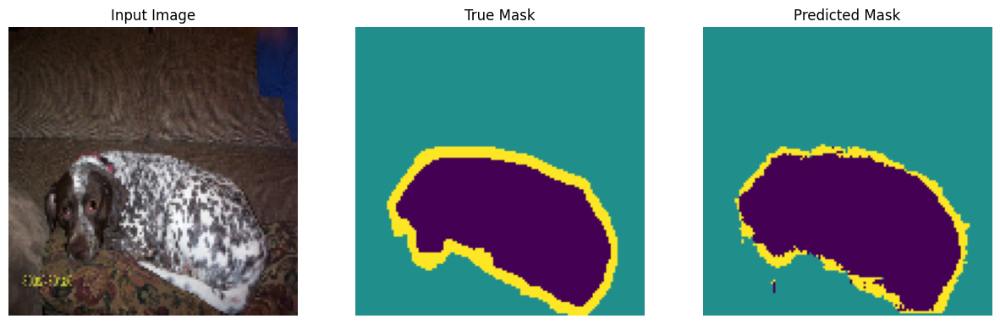


Sample Prediction after epoch 6

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9340 - loss: 0.1645
Epoch 7/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


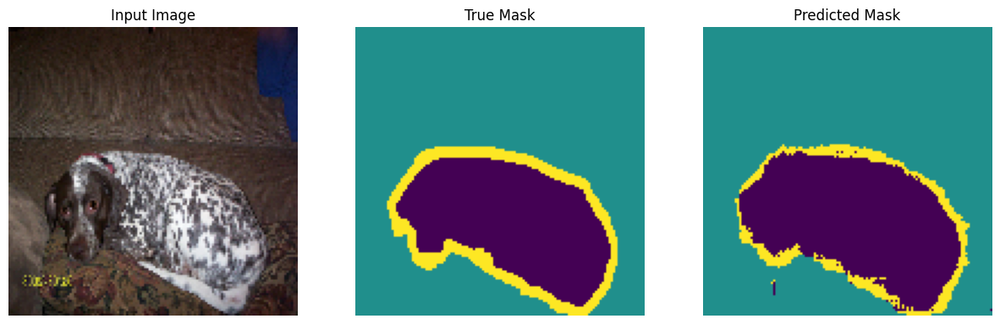


Sample Prediction after epoch 7

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.9363 - loss: 0.1582
Epoch 8/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


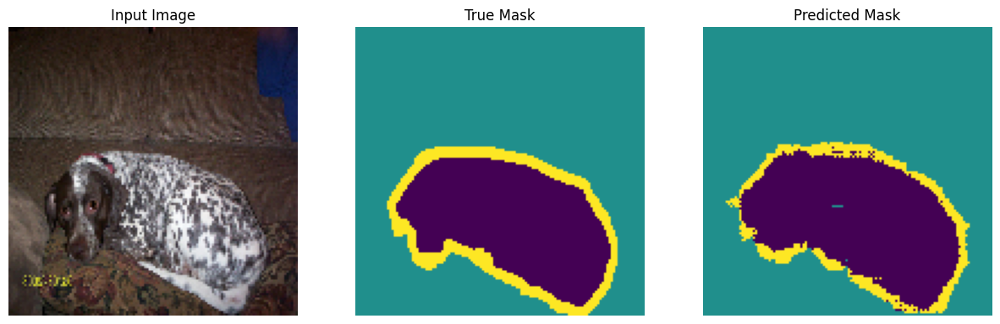


Sample Prediction after epoch 8

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.9372 - loss: 0.1560
Epoch 9/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


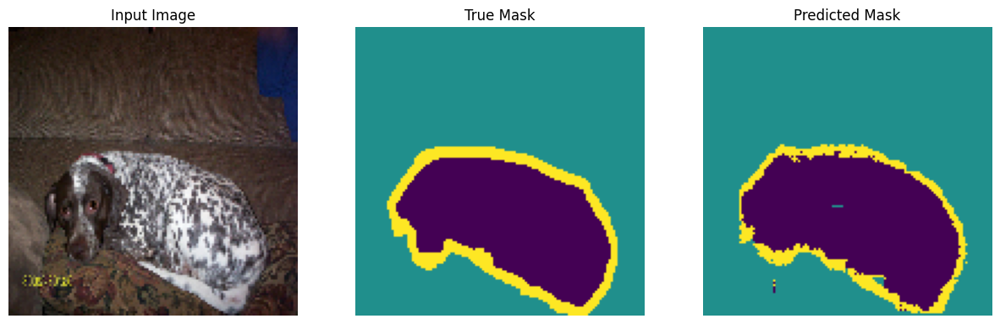


Sample Prediction after epoch 9

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step - accuracy: 0.9358 - loss: 0.1597
Epoch 10/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


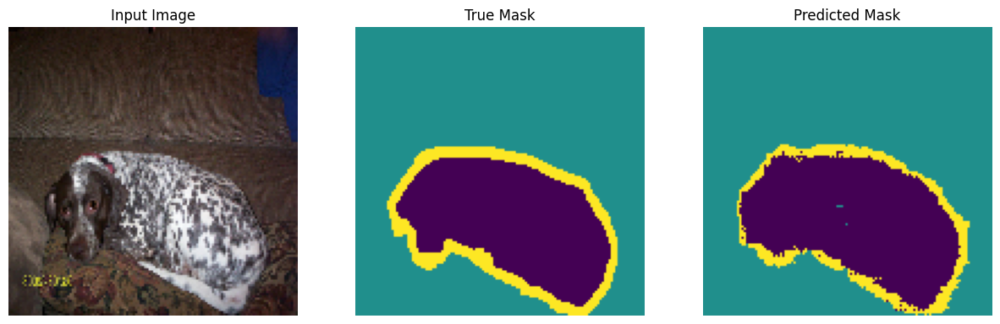


Sample Prediction after epoch 10

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - accuracy: 0.9357 - loss: 0.1590
Epoch 11/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


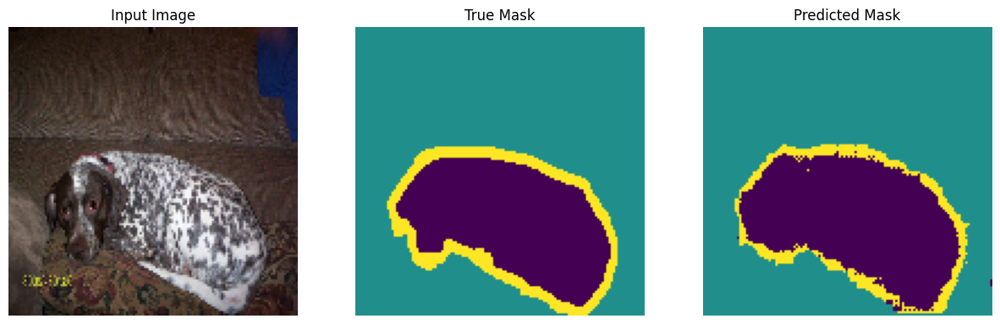


Sample Prediction after epoch 11

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - accuracy: 0.9351 - loss: 0.1612
Epoch 12/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


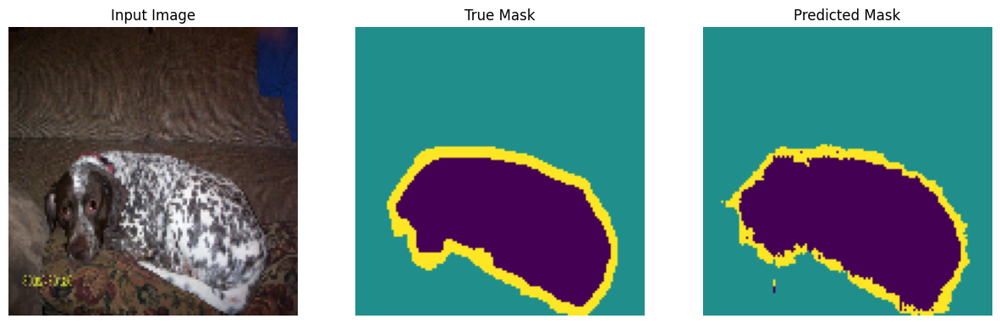


Sample Prediction after epoch 12

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - accuracy: 0.9356 - loss: 0.1588
Epoch 13/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


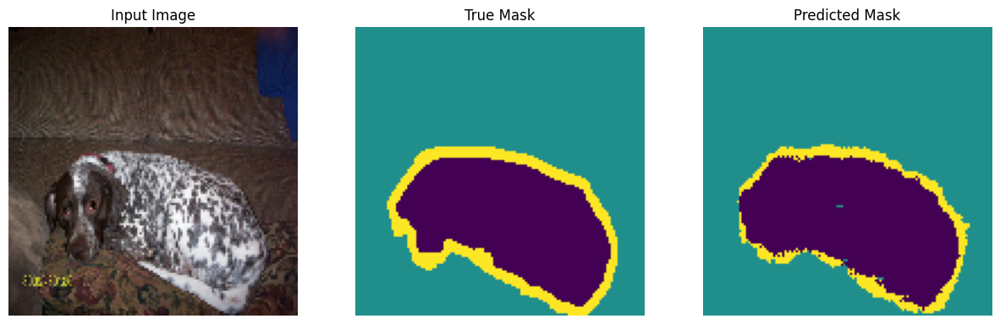


Sample Prediction after epoch 13

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.9368 - loss: 0.1561
Epoch 14/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


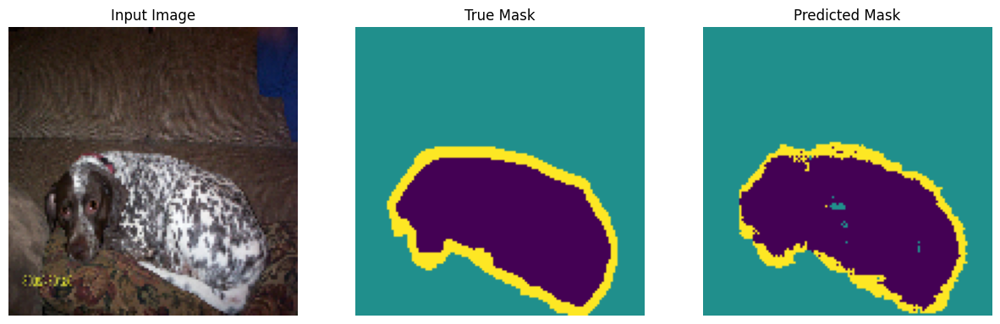


Sample Prediction after epoch 14

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - accuracy: 0.9394 - loss: 0.1502
Epoch 15/15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


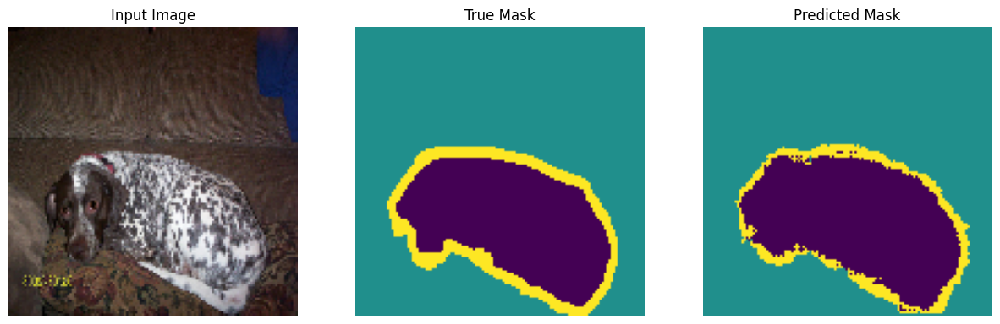


Sample Prediction after epoch 15

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.9386 - loss: 0.1509


In [ ]:
EPOCHS = 15


weighted_model_history = weighted_model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=10,

                          callbacks=[DisplayCallback()])


In [ ]:
import matplotlib.pyplot as plt

def display_predictions(dataset, model, num_images=5):
    image_count = 0
    plt.figure(figsize=(15, num_images * 3))

    for batch in dataset:

        if isinstance(batch, tuple):
            if len(batch) == 2:
                images, labels = batch
            elif len(batch) == 3:
                images, labels, _ = batch
        else:
            images, labels = batch

        preds = model.predict(images)

        preds = tf.argmax(preds, axis=-1)
        labels = tf.squeeze(labels)

        batch_size = images.shape[0]

        for i in range(batch_size):
            if image_count >= num_images:
                break

            plt.subplot(num_images, 3, image_count * 3 + 1)
            plt.imshow(images[i])
            plt.title('Input Image')
            plt.axis('off')

            plt.subplot(num_images, 3, image_count * 3 + 2)
            plt.imshow(labels[i], cmap='jet')
            plt.title('True Mask')
            plt.axis('off')

            plt.subplot(num_images, 3, image_count * 3 + 3)
            plt.imshow(preds[i], cmap='jet')
            plt.title('Predicted Mask')
            plt.axis('off')

            image_count += 1

        if image_count >= num_images:
            break

    plt.tight_layout()
    plt.show()


Normal Model Predictions:
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


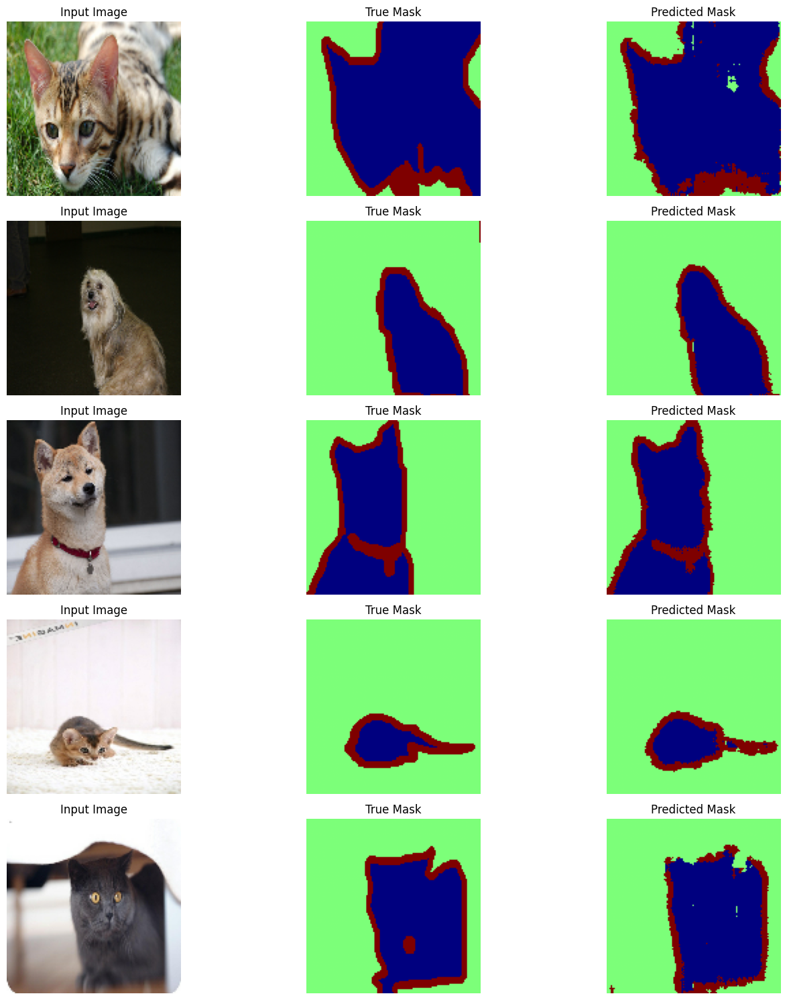

Weighted Model Predictions:
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


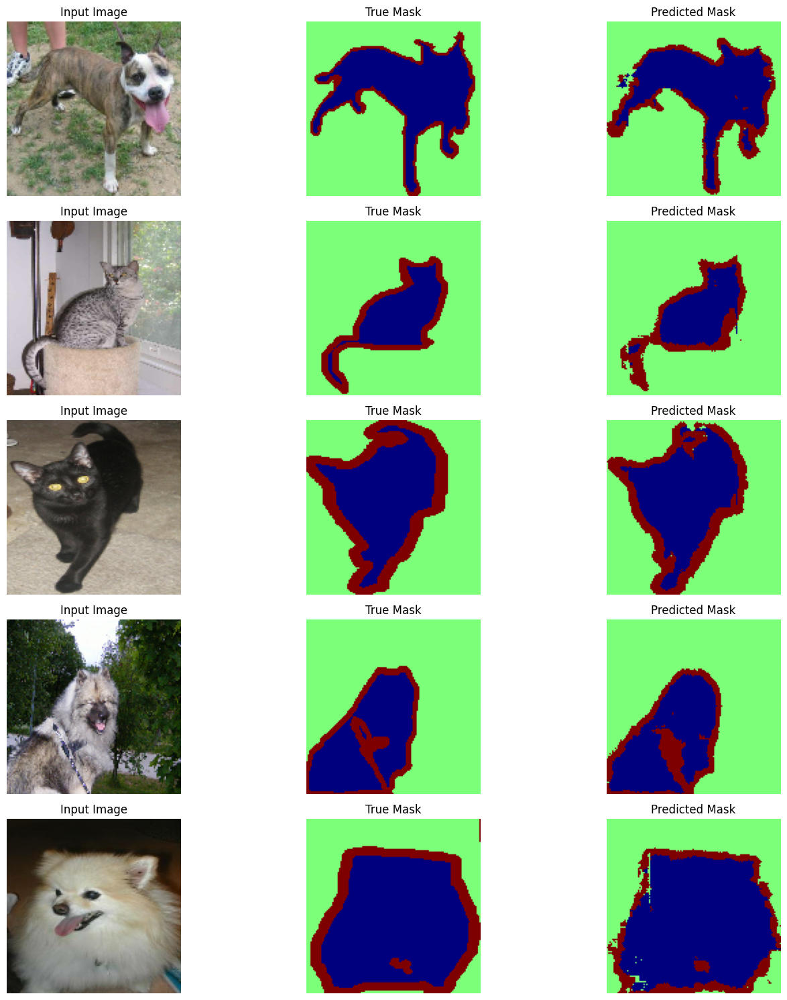

In [ ]:
print("Normal Model Predictions:")
display_predictions(train_batches, model, num_images=5)

print("Weighted Model Predictions:")
display_predictions(train_batches.map(add_sample_weights), weighted_model, num_images=5)




In [ ]:
import matplotlib.pyplot as plt

def compare_models(dataset, normal_model, weighted_model, num_images=5):
    image_count = 0
    plt.figure(figsize=(20, num_images * 4))

    for batch in dataset:

        if isinstance(batch, tuple):
            if len(batch) == 2:
                images, labels = batch
            elif len(batch) == 3:
                images, labels, _ = batch
        else:
            images, labels = batch

        preds_normal = normal_model.predict(images)
        preds_weighted = weighted_model.predict(images)

        preds_normal = tf.argmax(preds_normal, axis=-1)
        preds_weighted = tf.argmax(preds_weighted, axis=-1)
        labels = tf.squeeze(labels)

        batch_size = images.shape[0]

        for i in range(batch_size):
            if image_count >= num_images:
                break

            idx = image_count

            plt.subplot(num_images, 4, idx * 4 + 1)
            plt.imshow(images[i])
            plt.title('Input Image')
            plt.axis('off')

            plt.subplot(num_images, 4, idx * 4 + 2)
            plt.imshow(labels[i], cmap='jet')
            plt.title('True Mask')
            plt.axis('off')

            plt.subplot(num_images, 4, idx * 4 + 3)
            plt.imshow(preds_normal[i], cmap='jet')
            plt.title('Normal U-Net Prediction')
            plt.axis('off')

            plt.subplot(num_images, 4, idx * 4 + 4)
            plt.imshow(preds_weighted[i], cmap='jet')
            plt.title('Weighted U-Net Prediction')
            plt.axis('off')

            image_count += 1

        if image_count >= num_images:
            break

    plt.tight_layout()
    plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


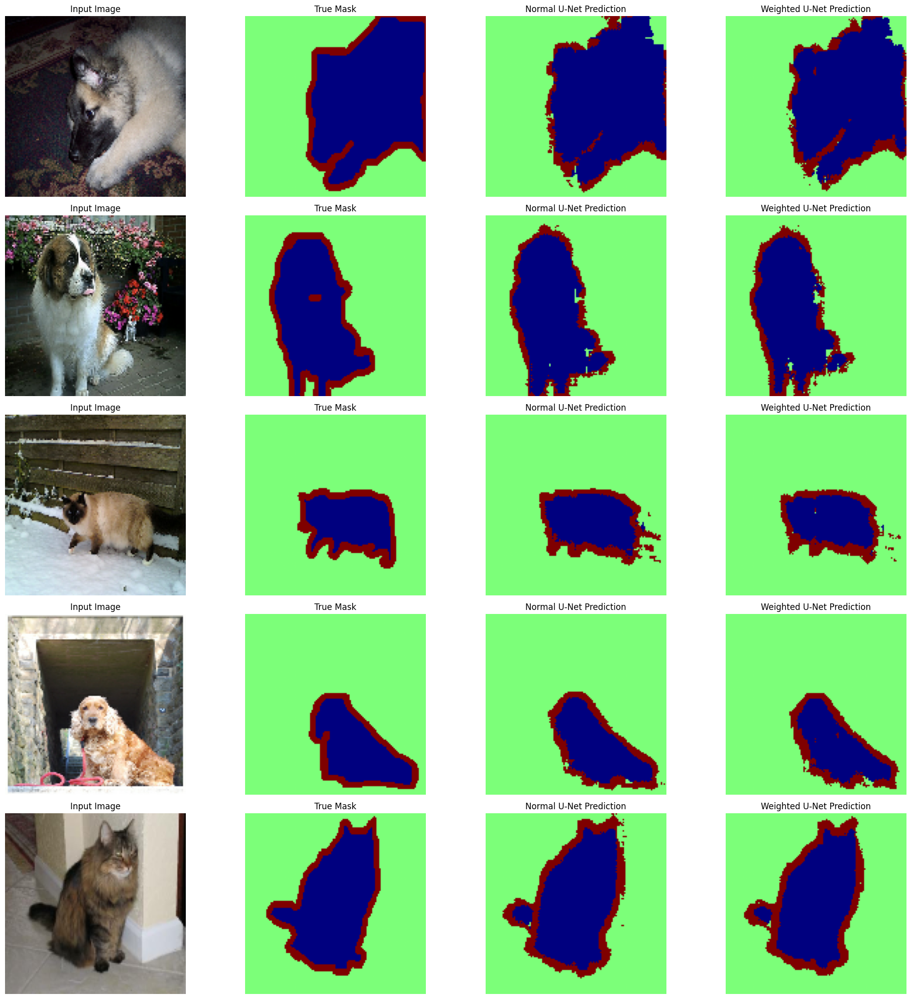

In [ ]:
compare_models(
    dataset=train_batches.map(add_sample_weights),  \
    normal_model=model,
    weighted_model=weighted_model,
    num_images=5
)


**Evaluation Metrics**

**Intersection Over Union**

Intersection over Union (IoU) is a popular evaluation metric used for image segmentation tasks. It measures the overlap between the predicted segmentation and the ground truth mask for each class.

\begin{equation}
\text{IoU} = \frac{\text{Area of Overlap}}{\text{Area of Union}} = \frac{|\text{Prediction} \cap \text{GroundTruth}|}{|\text{Prediction} \cup \text{GroundTruth}|}
\end{equation}

This score ranges from 0 to 1, where:

    - 1 means perfect overlap.
    - 0 means no overlap at all.

In [ ]:
import numpy as np
import tensorflow as tf

def compute_iou(y_true, y_pred, num_classes):
    ious = []
    for i in range(num_classes):
        y_true_i = (y_true == i)
        y_pred_i = (y_pred == i)
        intersection = np.logical_and(y_true_i, y_pred_i).sum()
        union = np.logical_or(y_true_i, y_pred_i).sum()
        if union == 0:
            ious.append(np.nan)  # Avoid divide by zero
        else:
            ious.append(intersection / union)
    return np.nanmean(ious)




The Dice Coefficient (also called the F1 score in binary classification) measures the overlap between the predicted segmentation and the ground truth:

\begin{equation}
\text{Dice}(A, B) = \frac{2|A \cap B|}{|A| + |B|}
\end{equation}


Where:

*   \( A \) is the set of predicted pixels for a class.
*    \( B \) is the set of ground truth pixels for that class.
*    \$ |A \cap B| \$ is the intersection (correct predictions).
*    \$ |A| + |B| \ \$ is the total number of predicted and true pixels.



   




In [ ]:
def dice_coefficient(y_true, y_pred, num_classes):
    dice_scores = []
    smooth = 1e-6
    for i in range(num_classes):
        y_true_i = (y_true == i).astype(np.float32)
        y_pred_i = (y_pred == i).astype(np.float32)
        intersection = np.sum(y_true_i * y_pred_i)
        dice = (2. * intersection + smooth) / (np.sum(y_true_i) + np.sum(y_pred_i) + smooth)
        dice_scores.append(dice)
    return np.mean(dice_scores)


In [ ]:
def evaluate_model(model, dataset, num_classes=3, max_batches=10):
    all_preds = []
    all_labels = []

    for i, batch in enumerate(dataset):
        if i >= max_batches:
            break

        # Handle tuple length (2 or 3)
        if len(batch) == 2:
            images, labels = batch
        elif len(batch) == 3:
            images, labels, _ = batch

        preds = model.predict(images)
        preds = tf.argmax(preds, axis=-1).numpy()
        labels = tf.squeeze(labels).numpy()

        all_preds.append(preds)
        all_labels.append(labels)

    y_pred = np.concatenate(all_preds, axis=0)
    y_true = np.concatenate(all_labels, axis=0)

    iou = compute_iou(y_true, y_pred, num_classes)
    dice = dice_coefficient(y_true, y_pred, num_classes)

    return iou, dice


In [ ]:
iou_score, dice_score = evaluate_model(model, test_batches, num_classes=3)
print(f"IoU Score: {iou_score:.4f}")
print(f"Dice Score: {dice_score:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
IoU Score: 0.7246
Dice Score: 0.8234


In [ ]:
iou_score, dice_score = evaluate_model(weighted_model, test_batches, num_classes=3)
print(f"IoU Score: {iou_score:.4f}")
print(f"Dice Score: {dice_score:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
IoU Score: 0.7371
Dice Score: 0.8342
